In [1]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import plotly.graph_objects as go
import plotly.offline as py
import xarray as xr

In [2]:
# Define Plotting Functions

#Modified from chain.ipynb

def plot_tau_grid_side_by_side(
    tau_arts_layer,         # (n_layer, n_wvn)
    tau_calc_layer,         # (n_layer, n_wvn)
    p_hl_Pa,                # (n_level,) half-level pressures [Pa]
    nu_grid=None,           # (n_wvn,) optional, for titles
    wvn_indices=None,       # iterable of indices to plot; None -> auto sample
    max_plots=24,           # cap to avoid huge figures
    ncols=4,                # subplots per row
    xlog=True,
):
    """
    One subplot per wavenumber index. Each panel overlays:
      - ARTS layer optical depth (solid)
      - τ from linear k × Δz (dashed)
    """
    tauA = np.asarray(tau_arts_layer)
    tauC = np.asarray(tau_calc_layer)
    assert tauA.shape == tauC.shape, f"Shape mismatch: {tauA.shape} vs {tauC.shape}"
    n_layers, n_wvn = tauA.shape

    # layer pressure for y-axis
    p = np.asarray(p_hl_Pa, dtype=float)
    p_layer_hPa = 0.5 * (p[:-1] + p[1:]) / 100.0  # (n_layers,)

    # choose which wavenumber indices to show
    if wvn_indices is None:
        nplot = min(max_plots, n_wvn)
        # evenly spaced across the spectrum
        wvn_indices = np.linspace(0, n_wvn - 1, nplot, dtype=int)
    else:
        wvn_indices = list(wvn_indices)[:max_plots]

    nplot = len(wvn_indices)
    nrows = int(np.ceil(nplot / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(3.4*ncols, 3.6*nrows), sharey=True)
    axes = np.atleast_1d(axes).ravel()

    eps = 1e-20  # avoid log(0)
    for ax, j in zip(axes, wvn_indices):
        tA = np.clip(tauA[:, j], eps, None)
        tC = np.clip(tauC[:, j], eps, None)

        # per-panel RMS (absolute)
        rms = np.sqrt(np.mean((tauC[:, j] - tauA[:, j])**2))

        ax.plot(tA, p_layer_hPa, lw=1.5, label="ARTS")
        ax.plot(tC, p_layer_hPa, '--', lw=1.5, label="k×Δz")

        if xlog:
            ax.set_xscale('log')
        ax.invert_yaxis()
        ax.grid(alpha=0.3)
        title = f"idx {j}"
        if nu_grid is not None:
            title += f" | {nu_grid[j]:.1f} cm⁻¹"
        title += f"\nRMS={rms:.2e}"
        ax.set_title(title, fontsize=9)

    # tidy blanks (if any)
    for ax in axes[nplot:]:
        ax.axis('off')

    # shared labels & legend
    axes[0].set_ylabel("Pressure [hPa]")
    for ax in axes[(nrows-1)*ncols:nrows*ncols]:
        if ax.has_data():
            ax.set_xlabel("τ (dimensionless)")

    # one legend for the figure
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper right", frameon=False)
    fig.tight_layout()
    plt.show()


In [3]:
# Taken from Visual_250.ipynb 

def plot_all_TP_maps(kappa_species, T_samples, P_samples,
                     species_name, k_thresh=1e-5):
    """
    kappa_species : (n_wvn, n_p, n_T)
    T_samples     : (n_T,)
    P_samples     : (n_p,)
    """
    n_wvn = kappa_species.shape[0]
    nrows, ncols = 16,4
    assert n_wvn <= nrows * ncols, "Increase nrows*ncols if n_wvn > 64"

    # Build T–P mesh (Pa -> hPa)
    T2D, P2D = np.meshgrid(T_samples, P_samples / 100.0)

    # Make κ safe for LogNorm (replace ≤0 with threshold)
    k_safe = np.where(kappa_species <= 0, k_thresh, kappa_species)
    global_max = k_safe.max()

    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(3*ncols, 3*nrows),
                             sharex=True, sharey=True)

    axes = axes.ravel()
    pcm = None

    for i in range(nrows * ncols):
        ax = axes[i]
        if i < n_wvn:
            k_slice = k_safe[i, :, :]   # (p, T)
            pcm = ax.pcolormesh(
                T2D, P2D, k_slice,
                norm=LogNorm(vmin=k_thresh, vmax=global_max),
                shading="auto",
                cmap="viridis"
            )
            ax.set_yscale("log")
            ax.invert_yaxis()
            ax.set_title(f"idx {i}", fontsize=8)
        else:
            ax.axis("off")

    # shared labels + colorbar
    fig.text(0.5, 0.04, "Temperature [K]", ha="center")
    fig.text(0.04, 0.5, "Pressure [hPa]", va="center", rotation="vertical")

    cbar = fig.colorbar(pcm, ax=axes.tolist(), shrink=0.6)
    cbar.set_label("κₘ [m²/kg]")

    fig.suptitle(f"{species_name} κₘ(T,p) for all wavenumber indices",
                 y=0.92, fontsize=14)
    plt.show()

def perform_LR(
    X_full,
    y_full,
    color,
    pred_var,
    species,
    n_wvn_list,
    test_set):
    #LR for Each Wvn of abs coeff vs pred_var
    kappas_LR = np.empty(shape = (len(n_wvn_list),test_set.shape[0],test_set.shape[1]),dtype = float)
    #set up plotting:
    nrows, ncols = 16, 4
    fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(3*ncols, 3*nrows),
                                 sharex=True, sharey=True,squeeze=True)
    axes = axes.ravel()
    
    #run LR for CO2 for each wvn
    
    idx_ax =0
    for i in n_wvn_list:
        idx = [j*n_wvn+i for j in range(Pn)] #get the idx for the current wavenumber from which to select data
        X = X_full[idx,:].flatten(order= "F")
        idx_sort = X.argsort()
        X = X[idx_sort]
        y = y_full[idx,:].flatten(order = "F")[idx_sort]
        model = LinearRegression()
        model.fit(X.reshape(-1,1), y.reshape(-1,1))
        for j in range(test_set.shape[0]):
            kappas_LR[idx_ax,j,:] = model.predict(test_set[j,:].reshape(-1,1)).reshape(1,-1)
        #df.iloc[idx_ax,0] = mean_squared_error(test_set, kappas_LR[i,:,:])
        #df.iloc[idx_ax,1] = r2_score(test_set, kappas_LR[i,:,:])
    
        # set up plotting
        ax = axes[idx_ax]
        if pred_var == "Pressure":
            color_var = "Temperature"
            c =color[idx,:].flatten(order = "F")
        else:
            color_var="Pressure"
            c = np.power(color[idx,:].flatten(order="F"),10)
            ax.set_yscale("log")
        if i < n_wvn:
            scatter = ax.scatter(
            X, 
            y, 
            c=c[idx_sort], 
            label='Actual Data',
            cmap='viridis',
            s=1
        )
        
        # Regression line plot
        ax.plot(
            X, 
            model.predict(X.reshape(-1, 1)), 
            color = 'red', 
            label='Regression Line'
        )
        cbar = fig.colorbar(scatter, ax=ax)
        cbar.set_label(f'{color_var}') 
        # Set labels, title, and legend for the current axis
        ax.set_xlabel(f'{pred_var}')
        ax.set_ylabel(f'{species} Abs Coeff in log10')
        ax.set_title(f"Linear Regression, idx {i}", fontsize=8)
        ax.legend()
        idx_ax+=1
    for j in range(len(n_wvn_list), len(axes)):
        fig.delaxes(axes[j])
    fig.text(0.5, 0.04, f"pred_var", ha="center")
    fig.text(0.04, 0.5, f"{species} Absoprtion Coeff" , va="center", rotation="vertical")
    
    
    fig.suptitle(f"{species} log10(κₘ(T,p))vs{pred_var} for all wavenumber indices",
                 y=0.92, fontsize=14)
    plt.tight_layout()
    plt.show()
    return kappas_LR
    
# Try power of 2 in pressure:

def perform_LR_power(
    X_full,
    y_full,
    color,
    pred_var,
    species,
    n_wvn_list,
    power,
    test_set):
    #LR for Each Wvn of abs coeff vs pred_var
    data = np.zeros(shape = (len(n_wvn_list),2))
    kappas_LR = np.empty(shape = (len(n_wvn_list),test_set.shape[0],test_set.shape[1]),dtype = float)
    
    #set up plotting:
    nrows, ncols = 16, 4
    fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(3*ncols, 3*nrows),
                                 sharex=True, sharey=True,squeeze=True)
    axes = axes.ravel()
    
    #run LR for CO2 for each wvn
    
    idx_ax =0
    for i in n_wvn_list:
        idx = [j*n_wvn+i for j in range(Pn)] #get the idx for the current wavenumber from which to select data
        X = X_full[idx,:].flatten(order= "F")
        argsort = X.argsort()
        X_power = np.array([X[argsort]**j for j in range(power+1)]).T
        y = y_full[idx,:].flatten(order = "F")[argsort]
        model = LinearRegression(fit_intercept=False)
        model.fit(X_power, y.reshape(-1,1))
        for j in range(test_set.shape[0]):
            test = np.array([test_set[j,:]**i for i in range(power+1)]).T
            kappas_LR[idx_ax,j,:] = model.predict(test).reshape(1,-1)
        # set up plotting
        ax = axes[idx_ax]
        # set up plotting
        ax = axes[idx_ax]
        if pred_var == "Pressure":
            color_var = "Temperature"
            c =color[idx,:].flatten(order = "F")
        else:
            color_var="Pressure"
            c = np.power(color[idx,:].flatten(order="F"),10)
            ax.set_yscale("log")
        if i < n_wvn:
            scatter = ax.scatter(
            X[argsort], 
            y, 
            c=color[idx,:].flatten(order = "F")[argsort], 
            label='Actual Data',
            cmap='viridis',
            s=1
        )
        
        # Regression line plot
        ax.plot(
            X[argsort], 
            model.predict(X_power), 
            color = 'red', 
            label='Regression Line'
        )
        cbar = fig.colorbar(scatter, ax=ax)
        cbar.set_label(f'{color_var}') 
        # Set labels, title, and legend for the current axis
        ax.set_xlabel(f'{pred_var}')
        ax.set_ylabel(f'{species} Abs Coeff in Log10')
        ax.set_title(f"Linear Regression, idx {i}", fontsize=8)
        ax.legend()
        idx_ax+=1
    for j in range(len(n_wvn_list), len(axes)):
        fig.delaxes(axes[j])
    fig.text(0.5, 0.04, f"pred_var", ha="center")
    fig.text(0.04, 0.5, f"{species} Absoprtion Coeff log10" , va="center", rotation="vertical")
    
    
    fig.suptitle(f"{species} Log10(κₘ(T,p))vs{pred_var} for all wavenumber indices, quadratic",
                 y=0.92, fontsize=14)
    plt.tight_layout()
    plt.show()
    return kappas_LR





def plot_df(df,wvn_list,pred_var,species):

    fig, axes = plt.subplots(1, 2,
                     figsize=(12, 4),
                     sharex=True, sharey=False)
    for i in range(df.shape[1]):
        axes[i].plot(wvn_list,df.iloc[:,i], color = "blue", label = df.columns[i])
        axes[i].set_xlabel('Wave Number idx')
        axes[i].set_ylabel(df.columns[i])
        axes[i].set_title(f"Plot {df.columns[i]} per wvn for {species} Linear Regression", fontsize=8)
        axes[i].legend()
    axes[1].set_ylim(-1, 2)
    axes[0].set_ylim(0, 45)
    fig.suptitle(f"{species} Metricsvs{pred_var} for all wavenumber indices",
                 y=0.92, fontsize=14)
    plt.tight_layout()
    plt.show() 

def plot_mse(df,wvn_list,pred_var,species):

    fig, axes = plt.subplots(1, 1,
                     figsize=(12, 4),
                     sharex=True, sharey=False)
    axes.plot(wvn_list,df.iloc[:,1], color = "blue", label = df.columns[1])
    axes.set_xlabel('Wave Number idx')
    axes.set_ylabel(df.columns[1])
    axes.set_title(f"Plot {df.columns[1]} per wvn for {species} Linear Regression", fontsize=8)
    axes.set_ylim(-1, 2)
    fig.suptitle(f"{species} MSE vs{pred_var} for all wavenumber indices",
                 y=0.92, fontsize=14)
    plt.tight_layout()
    plt.show() 

In [4]:
#Step 1:
CO2 = pd.read_csv("Temp_Pres_24Nov25_orig.csv").to_numpy().T
CO2_Temp = CO2[:,0]#[0:9] #check input data to see how many T samples were used
CO2_Pres = CO2[:,1]
CO2_kappas = pd.read_csv("kappa_wvn_pT_CO2_24Nov25_orig.csv").to_numpy()

CO2_kappas_reshaped = CO2_kappas.reshape(64,CO2_Pres.size,CO2_Temp.size)

O3_Temp = CO2_Temp
O3_Pres = CO2_Pres
O3_kappas = pd.read_csv("kappa_wvn_pT_O3_24Nov25_orig.csv").to_numpy()

O3_kappas_reshaped = O3_kappas.reshape(64,CO2_Pres.size,CO2_Temp.size)


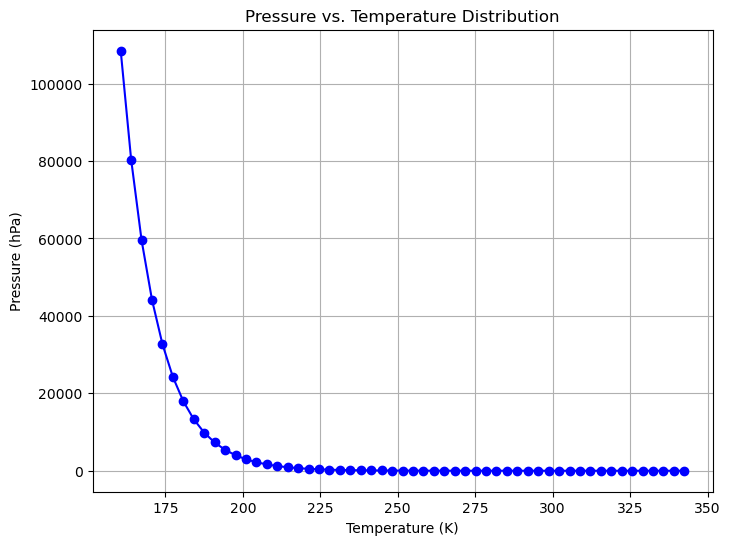

In [5]:
#Plot pressure vs temperature to visualize how pressure and temperature are distributed:

plt.figure(figsize=(8, 6))
plt.plot(CO2_Temp, CO2_Pres, marker='o', linestyle='-', color='b') 

plt.xlabel("Temperature (K)")
plt.ylabel("Pressure (hPa)")
plt.title("Pressure vs. Temperature Distribution")
plt.grid(True)
plt.show()



In [6]:
#load CKMDIP datasets:
profiles1 = xr.open_dataset("ckdmip_evaluation1_concentrations_present.nc")
profiles2 = xr.open_dataset("ckdmip_evaluation2_concentrations_present.nc")

test_temperature = np.concatenate([profiles1.temperature_hl.values, profiles2.temperature_hl.values],axis=0)
test_pressure = np.concatenate([profiles1.pressure_hl.values, profiles2.pressure_hl.values],axis=0)

In [7]:
# Load DDQ and get number of wavenumbers:
ddq = xr.open_dataset("DDQ_LW_present.h5",engine = "netcdf4")
ddq.compute()


n_lvls = profiles1.pressure_hl.size
n_wvn  = ddq.S.size



In [8]:
# Get maxes and mins of temp and presusre for CO2 and O3:
# Recall: the generated Temp and press grid is resued for all species and the data was saved for both species using the same grid.

print(f"max temp is: {CO2_Temp.max()} K")
print(f"min Temp is: {CO2_Temp.min()} K")
print(f"max Press is: {CO2_Pres.max()} hPa")
print(f"min Press is: {CO2_Pres.min()} hPa")

max temp is: 342.4696701049805 K
min Temp is: 160.6008514404297 K
max Press is: 108487.484765625 hPa
min Press is: 0.01 hPa


In [9]:
# Flatten everything to do linear regression for varying pressure only: 
# Kappas will be flattened so that the resulting shape repeates pressure per wavenumber for each pressure and then for each temperature
# This means that we have the first sample pressure for all 64 wavvenumbers for the first sampled temperature, iterating through all pressures for the first sampled temperature. Then, this pattern repeats for the next sample temperature and onwards.

wvn_Pn, Tn = CO2_kappas.shape
Pn = int(wvn_Pn/n_wvn)

CO2_Temp_per_wvn = np.empty(shape = CO2_kappas.shape, dtype = float)
O3_Temp_per_wvn = np.empty(shape = O3_kappas.shape, dtype = float)
for i in range(Tn):
    CO2_Temp_per_wvn[:, i] = CO2_Temp[i]
    O3_Temp_per_wvn[:, i] = O3_Temp[i]
CO2_Pressure_per_wvn = np.empty(shape = CO2_kappas.shape, dtype =float)
O3_Pressure_per_wvn = np.empty(shape = O3_kappas.shape, dtype = float)
for i in range(Pn):
    CO2_Pressure_per_wvn[i*n_wvn: (i+1)*n_wvn,:]= CO2_Pres[i]
    O3_Pressure_per_wvn[i*n_wvn: (i+1)*n_wvn,:]= O3_Pres[i]


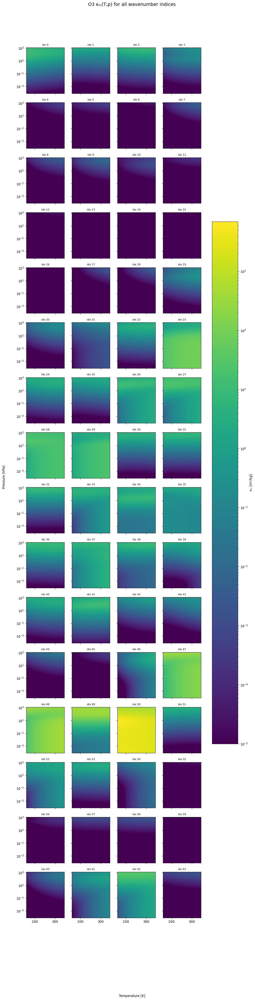

In [10]:
plot_all_TP_maps(O3_kappas_reshaped, O3_Temp, O3_Pres, "O3")

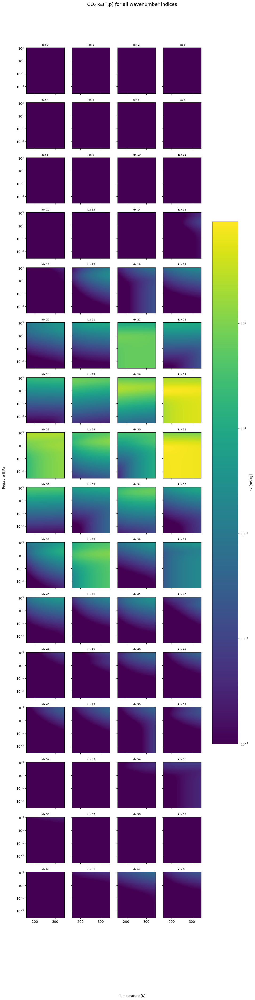

In [11]:
plot_all_TP_maps(CO2_kappas_reshaped, CO2_Temp, CO2_Pres, "CO₂")

Separate wvns per gas based on visual inspection into 0's, power = 1 and power =2 for LR. Future work would be to computationally modify the separation of wavenumbers instead of relying visually on the user.

In [12]:
#CO2 wave number separation:

CO2_wvn_0s = [i for i in range(17)] + [i for i in range(43,64)]
CO2_wvn_1s = [20,21,22,23,24,25,28,31,32,33,34,35,38,40]
CO2_wvn_2s = [17,18,19,20,27,29,30,36,37,39,41,42]

# confirm all 64 wvn are included:
assert len(CO2_wvn_0s + CO2_wvn_1s +CO2_wvn_2s) == 64, "Incorrect total number of wvn separated for CO2"


#Separate O2 wave numbers: 

O3_wvn_0s = [i for i in range(17)] + [i for i in range(43,64)]
O3_wvn_1s = [17,18,19,20,21,22,24,31,32,34,35,39,40]
O3_wvn_2s = [23,25,26,27,28,29,30,33,36,37,38,41,42]

# confirm all 64 wvn are included:
assert len(O3_wvn_0s + O3_wvn_1s +O3_wvn_2s) == 64, "Incorrect total number of wvn separated for O3"

Apply log10 transformation to temperature and pressure

In [13]:
CO2_Pressure = np.log10(CO2_Pressure_per_wvn)
O3_Pressure = np.log10(O3_Pressure_per_wvn)
CO2_kappas = np.where(CO2_kappas<=1e-5,0,np.log10(CO2_kappas))
O3_kappas = np.where(O3_kappas <= 1e-5, 0, np.log10(O3_kappas))

/tmp/ipykernel_5315/3159207611.py:4: RuntimeWarning:

divide by zero encountered in log10



Linear Regression in on one predictor variable with all samples

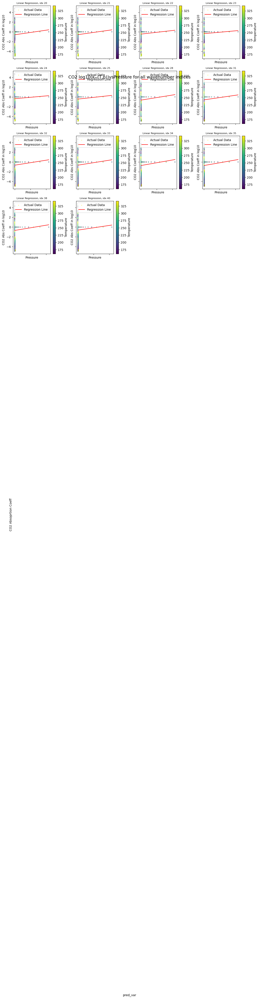

In [14]:
#LR for Each Wvn of abs coeff vs pressure: 
# CO2 Modeling for power 1
kappas_CO2_LR1 = perform_LR(CO2_Pressure_per_wvn,CO2_kappas,CO2_Temp_per_wvn,"Pressure","CO2",CO2_wvn_1s,test_pressure)

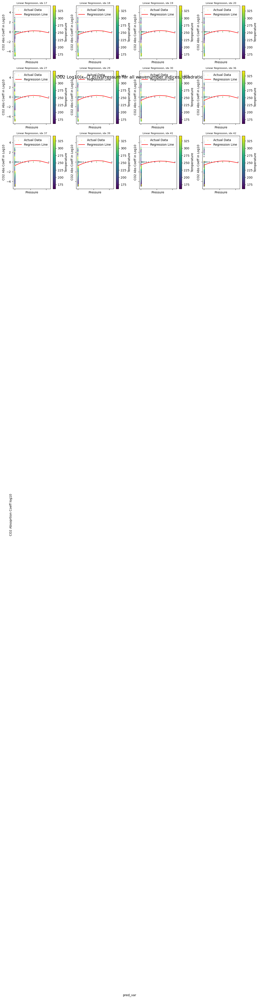

In [15]:
#LR power 2 for each wvn of acbs coeff vs pressure
# CO2 Abs vs Pressure up to power 2 
kappas_CO2_LR2 = perform_LR_power(CO2_Pressure_per_wvn,CO2_kappas,CO2_Temp_per_wvn,"Pressure","CO2",CO2_wvn_2s,2,test_pressure)


In [16]:
#reorganzize kappas into n_wvn,n_lvl

CO2_Abs_0s = np.zeros(shape = (len(CO2_wvn_0s),test_pressure.shape[0],test_pressure.shape[1]))
wvn_list_concat = CO2_wvn_0s+CO2_wvn_1s+CO2_wvn_2s
index = list(enumerate(wvn_list_concat))
sorted_index = sorted(index, key=lambda item: item[1])
sorted_indices = [i for i, value in sorted_index]

#concat kappas:

kappas_CO2_pred_pre_sort = np.concatenate([CO2_Abs_0s,np.power(10,kappas_CO2_LR1),np.power(10,kappas_CO2_LR2)], axis =0)

#sort the kappas based on wvn sort index
kappas_CO2_pred_sorted = kappas_CO2_pred_pre_sort[sorted_indices,:,:]

# save to np file:

np.savez('kappas_pred_CO2_pressure_predictor_only.npz', data1=kappas_CO2_pred_sorted)

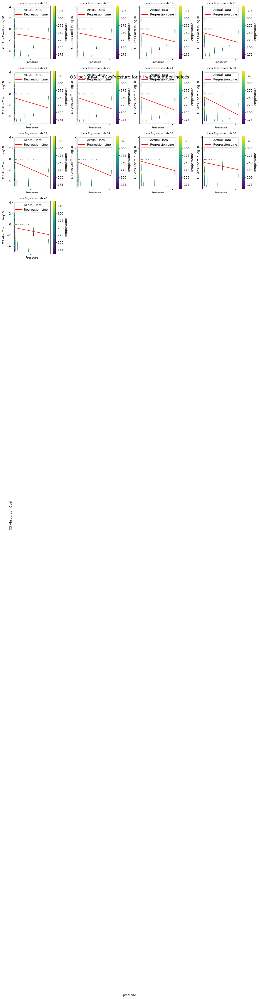

In [17]:
#LR for Each Wvn of abs coeff vs pressure: 
# O3 Modeling 
kappas_O3_LR1 = perform_LR(O3_Pressure_per_wvn,O3_kappas,O3_Temp_per_wvn,"Pressure","O3",O3_wvn_1s,test_pressure)

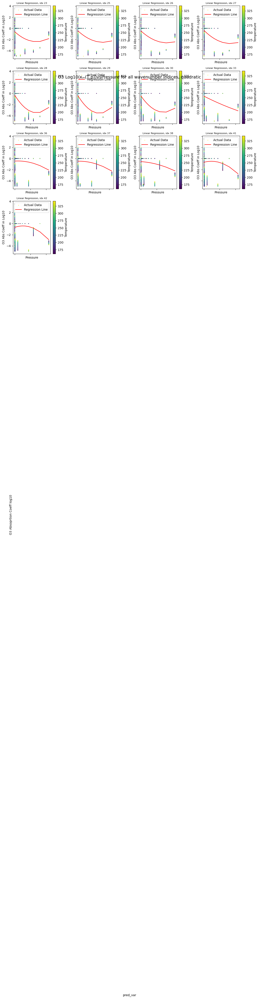

In [18]:
#plot_df(df_O3,n_wvn_list,"Pressure","O3")
kappas_O3_LR2 = perform_LR_power(O3_Pressure_per_wvn,O3_kappas,O3_Temp_per_wvn,"Pressure","O3",O3_wvn_2s,2,test_pressure)

In [19]:
#reorganzize kappas into n_wvn,n_lvl

O3_Abs_0s = np.zeros(shape = (len(O3_wvn_0s),test_pressure.shape[0],test_pressure.shape[1]))
wvn_list_concat = O3_wvn_0s+O3_wvn_1s+O3_wvn_2s
index = list(enumerate(wvn_list_concat))
sorted_index = sorted(index, key=lambda item: item[1])
sorted_indices = [i for i, value in sorted_index]

#concat kappas:

kappas_O3_pred_pre_sort = np.concatenate([O3_Abs_0s,np.power(10,kappas_O3_LR1),np.power(10,kappas_O3_LR2)], axis =0)

#sort the kappas based on wvn sort index
kappas_O3_pred_sorted = kappas_O3_pred_pre_sort[sorted_indices,:,:]

# save to np file:

np.savez('kappas_pred_O3_pressure_predictor_only.npz', data1=kappas_O3_pred_sorted)

Linear Regression for Temperature including all samples:

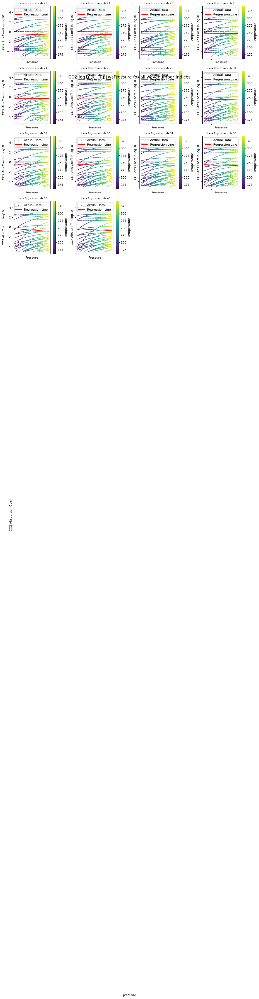

In [20]:
#LR for Each Wvn of abs coeff vs Temperature: 
# CO2 Modeling     
kappas_CO2_temp_LR1 = perform_LR(CO2_Temp_per_wvn,CO2_kappas,CO2_Temp_per_wvn,"Pressure","CO2",CO2_wvn_1s,test_temperature)

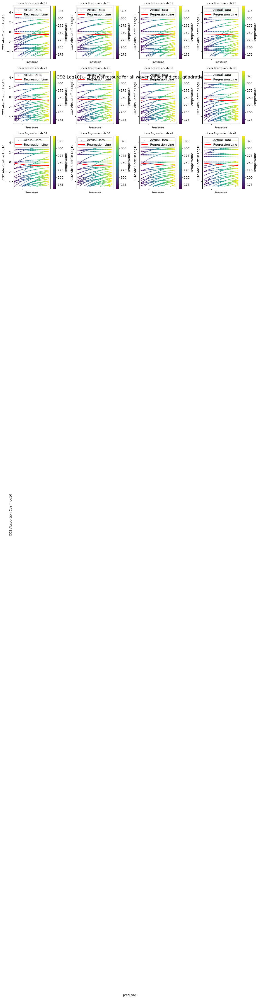

In [21]:
kappas_CO2_temp_LR2 = perform_LR_power(CO2_Temp_per_wvn,CO2_kappas,CO2_Temp_per_wvn,"Pressure","CO2",CO2_wvn_2s,2,test_temperature)

In [22]:
#reorganzize kappas into n_wvn,#cols,n_lvl

CO2_Abs_0s = np.zeros(shape = (len(CO2_wvn_0s),test_pressure.shape[0],test_pressure.shape[1]))
wvn_list_concat = CO2_wvn_0s+CO2_wvn_1s+CO2_wvn_2s
index = list(enumerate(wvn_list_concat))
sorted_index = sorted(index, key=lambda item: item[1])
sorted_indices = [i for i, value in sorted_index]

#concat kappas:

kappas_CO2_pred_pre_sort = np.concatenate([CO2_Abs_0s,np.power(10,kappas_CO2_temp_LR1),np.power(10,kappas_CO2_temp_LR2)], axis =0)

#sort the kappas based on wvn sort index
kappas_CO2_pred_sorted = kappas_CO2_pred_pre_sort[sorted_indices,:,:]

# save to np file:

np.savez('kappas_pred_CO2_temperature_predictor_only.npz', data1=kappas_CO2_pred_sorted)

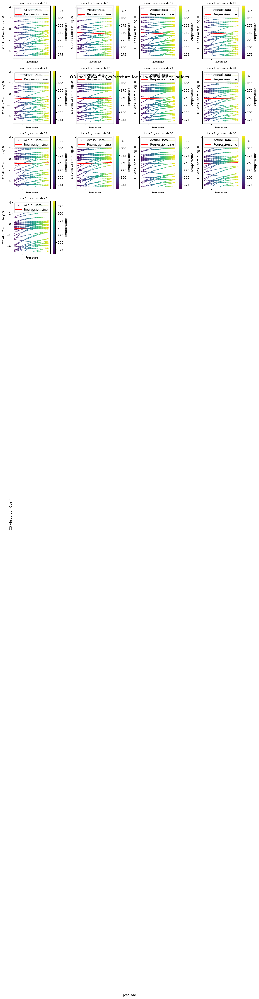

In [23]:
# repeat LR for O3 for abs coeff vs. temperature
kappas_O3_temp_LR1 = perform_LR(O3_Temp_per_wvn,O3_kappas,O3_Temp_per_wvn,"Pressure","O3",O3_wvn_1s,test_temperature)


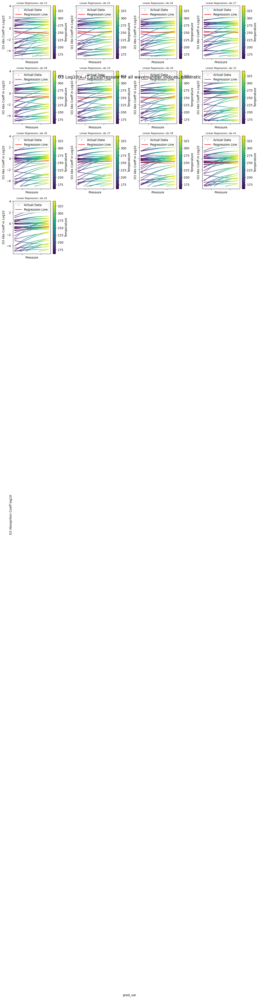

In [24]:
kappas_O3_temp_LR2 = perform_LR_power(O3_Temp_per_wvn,O3_kappas,O3_Temp_per_wvn,"Pressure","O3",O3_wvn_2s,2,test_temperature)

In [25]:
# reorganize kappas and save:

#reorganzize kappas into n_wvn,n_lvl

O3_Abs_0s = np.zeros(shape = (len(O3_wvn_0s),test_pressure.shape[0],test_pressure.shape[1]))
wvn_list_concat = O3_wvn_0s+O3_wvn_1s+O3_wvn_2s
index = list(enumerate(wvn_list_concat))
sorted_index = sorted(index, key=lambda item: item[1])
sorted_indices = [i for i, value in sorted_index]

#concat kappas:

kappas_O3_pred_pre_sort = np.concatenate([O3_Abs_0s,np.power(10,kappas_O3_temp_LR1),np.power(10,kappas_O3_temp_LR2)], axis =0)

#sort the kappas based on wvn sort index
kappas_O3_pred_sorted = kappas_O3_pred_pre_sort[sorted_indices,:,:]

# save to np file:

np.savez('kappas_pred_O3_temperature_predictor_only.npz', data1=kappas_O3_pred_sorted)


In [26]:
# PLS in Temp and Pressure:
def perform_PLS(
    P_full,
    T_full,
    y_full,
    color,
    pred_var,
    species,
    n_wvn_list,
    n_components,
    test_set,
    power):
    #LR for Each Wvn of abs coeff vs pred_var
    kappas_LR = np.empty(shape = (len(n_wvn_list),test_set.shape[0],test_set.shape[1]),dtype = float)
    
    #set up plotting:
    nrows, ncols = 16, 4
    fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(3*ncols, 3*nrows),
                                 sharex=True, sharey=True,squeeze=True)
    axes = axes.ravel()
    idx_ax =0
    for i in n_wvn_list:
        idx = [j*n_wvn+i for j in range(Pn)] #get the idx for the current wavenumber from which to select data
        P = P_full[idx,:].flatten(order = "F")
        argsort = np.argsort(P)
        P= P[argsort]
        T = T_full[idx,:].flatten(order = "F")
        T = T[argsort]
        if power == 1: 
                X = np.concatenate((T.reshape(-1,1),P.reshape(-1,1)),axis=1)
        elif power >1:
            ones = np.ones_like(P)
            X = np.empty(shape = (P.size,power*2),dtype = float)
            #X[:,0]=ones.ravel()
            idx_test =0
            for j in range(1,power+1):
                X[:,idx_test]=T**j
                idx_test+=1
                X[:,idx_test]=P**j
                idx_test+=1
        y = y_full[idx,:].flatten(order = "F")[argsort]
        model = PLSRegression(n_components)
        model.fit(X, y.reshape(-1,1))
        for j in range(test_set.shape[0]):
            if power == 1: 
                test = test_set[j,:,:]
            elif power >1:
                #ones = np.ones_like(test_set[j,:,0])
                test = np.empty(shape = (test_set.shape[1],power*2),dtype = float)
                #test[:,0]=ones
                idx_test =0
                for i in range(1,power+1):
                    test[:,idx_test]=test_set[j,:,0]**i
                    idx_test+=1
                    test[:,idx_test]=test_set[j,:,1]**i
                    idx_test+=1
            kappas_LR[idx_ax,j,:] = model.predict(test).ravel()
    
        # set up plotting
        ax = axes[idx_ax]
        # set up plotting
        ax = axes[idx_ax]
        if pred_var == "Pressure":
            color_var = "Temperature"
            c =color[idx,:].flatten(order = "F")
        else:
            color_var="Pressure"
            c = np.power(color[idx,:].flatten(order="F"),10)
            ax.set_yscale("log")
        if i < n_wvn:
            x_data = X[:,1] #if power == 1 else X[:,1]
            scatter = ax.scatter(
            x_data, 
            y, 
            c=color[idx,:].flatten(order = "F"), 
            label='Actual Data',
            cmap='viridis',
            s=1
        )
        
        # Regression line plot
        ax.plot(
            x_data, 
            model.predict(X), 
            color = 'red', 
            label='Regression Line',
            linewidth =1
        )
        cbar = fig.colorbar(scatter, ax=ax)
        cbar.set_label(f'{color_var}') 
        # Set labels, title, and legend for the current axis
        ax.set_xlabel(f'{pred_var} ')
        ax.set_ylabel(f'{species} log10 Abs Coeff')
        ax.set_title(f"Linear Regression, idx {i}", fontsize=8)
        ax.legend()
        idx_ax+=1
    for j in range(len(n_wvn_list), len(axes)):
        fig.delaxes(axes[j])
    fig.text(0.5, 0.04, f"pred_var", ha="center")
    fig.text(0.04, 0.5, f"{species} log10 Absoprtion Coeff" , va="center", rotation="vertical")    
    fig.suptitle(f"{species} log(κₘ(T,p)vs{pred_var}) for all wavenumber indices",
                 y=0.92, fontsize=14)
    plt.tight_layout()
    plt.show()
    return kappas_LR

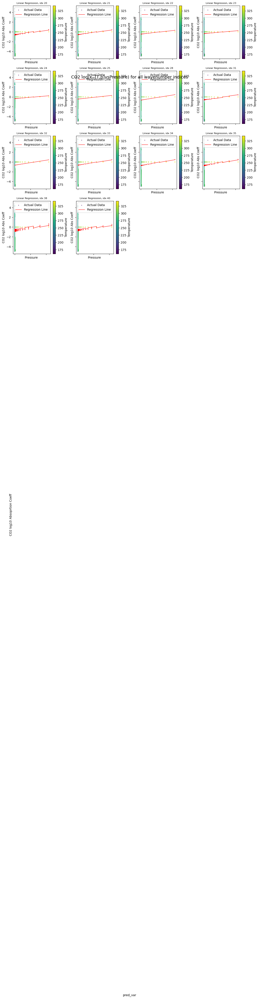

In [27]:
# Perform 2 Component PLS on CO2 for power 1
test_set = np.stack((test_temperature,test_pressure),axis=2)
kappas_CO2_PLS = perform_PLS(CO2_Pressure_per_wvn, CO2_Temp_per_wvn,CO2_kappas,CO2_Temp_per_wvn,"Pressure","CO2",CO2_wvn_1s,2,test_set,1)

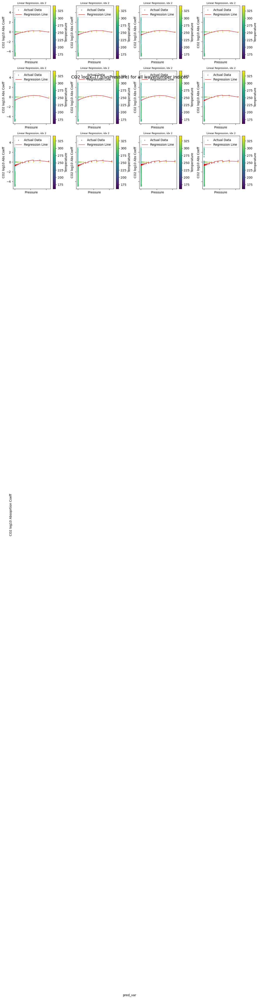

In [28]:
# Perform PLS power 2 for CO2:
kappas_CO2_PLS2 = perform_PLS(CO2_Pressure_per_wvn, CO2_Temp_per_wvn,CO2_kappas,CO2_Temp_per_wvn,"Pressure","CO2",CO2_wvn_2s,2,test_set,2)

In [29]:
#save CO2 results for PLS:
#reorganzize kappas into n_wvn,#cols,n_lvl

CO2_Abs_0s = np.zeros(shape = (len(CO2_wvn_0s),test_pressure.shape[0],test_pressure.shape[1]))
wvn_list_concat = CO2_wvn_0s+CO2_wvn_1s+CO2_wvn_2s
index = list(enumerate(wvn_list_concat))
sorted_index = sorted(index, key=lambda item: item[1])
sorted_indices = [i for i, value in sorted_index]

#concat kappas:

kappas_CO2_pred_pre_sort = np.concatenate([CO2_Abs_0s,np.power(10,kappas_CO2_PLS),np.power(10,kappas_CO2_PLS2)], axis =0)

#sort the kappas based on wvn sort index
kappas_CO2_pred_sorted = kappas_CO2_pred_pre_sort[sorted_indices,:,:]

# save to np file:

np.savez('kappas_pred_CO2_PLS.npz', data1=kappas_CO2_pred_sorted)


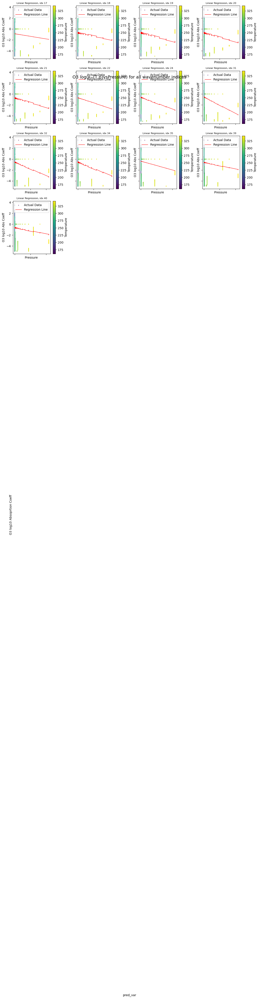

In [30]:
# Perform 2 component PLS on O3 for linear wvns
kappas_O3_PLS = perform_PLS(O3_Pressure_per_wvn, O3_Temp_per_wvn,O3_kappas,O3_Temp_per_wvn,"Pressure","O3",O3_wvn_1s,2,test_set,1)



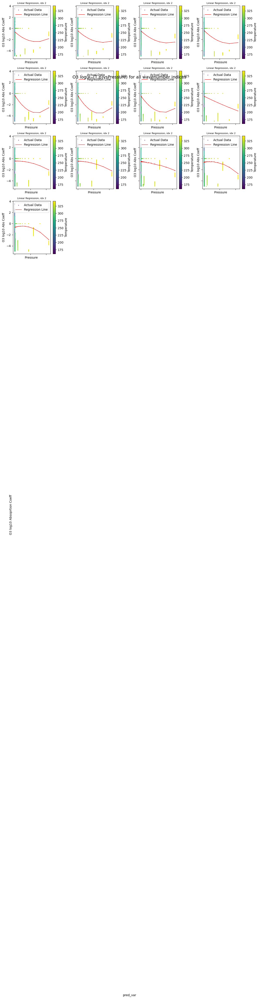

In [31]:
# Perform 2 compotnetn PLS on O3 for quadratic wvns
kappas_O3_PLS2 = perform_PLS(O3_Pressure_per_wvn, O3_Temp_per_wvn,O3_kappas,O3_Temp_per_wvn,"Pressure","O3",O3_wvn_2s,2,test_set,2)

In [32]:
# Save O3 PLS results for PLS: 

# reorganize kappas and save:

#reorganzize kappas into n_wvn,n_lvl

O3_Abs_0s = np.zeros(shape = (len(O3_wvn_0s),test_pressure.shape[0],test_pressure.shape[1]))
wvn_list_concat = O3_wvn_0s+O3_wvn_1s+O3_wvn_2s
index = list(enumerate(wvn_list_concat))
sorted_index = sorted(index, key=lambda item: item[1])
sorted_indices = [i for i, value in sorted_index]

#concat kappas:

kappas_O3_pred_pre_sort = np.concatenate([O3_Abs_0s,np.power(10,kappas_O3_PLS),np.power(10,kappas_O3_PLS2)], axis =0)

#sort the kappas based on wvn sort index
kappas_O3_pred_sorted = kappas_O3_pred_pre_sort[sorted_indices,:,:]

# save to np file:

np.savez('kappas_pred_O3_PLS.npz', data1=kappas_O3_pred_sorted)


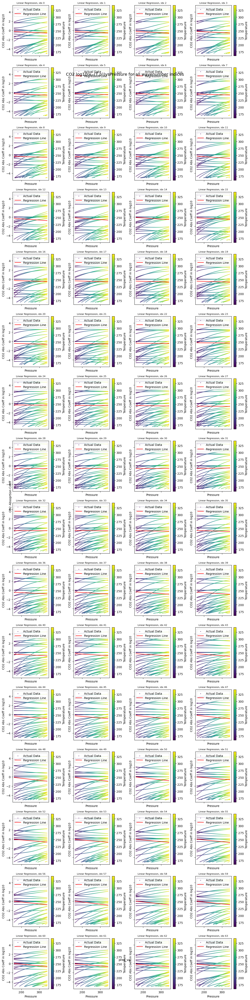

In [38]:
# perform Linear Regression with power 1 on everything:

wvn = [i for i in range(64)]
#CO2 LR power 1

CO2_kappas_power1_temp = perform_LR(CO2_Temp_per_wvn,CO2_kappas,CO2_Temp_per_wvn,"Pressure","CO2",wvn,test_temperature)
np.savez('CO2_kappas_power1_temp.npz', data1=CO2_kappas_power1_temp)



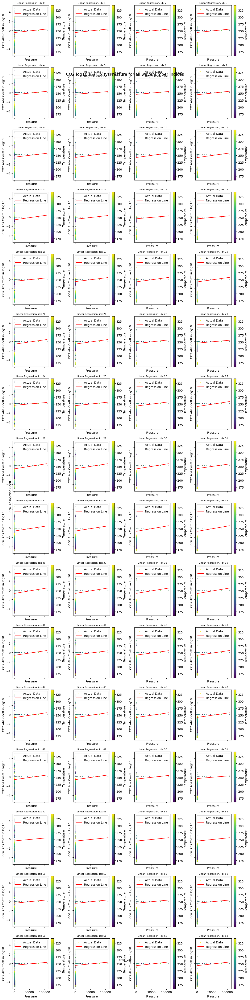

In [39]:
CO2_kappas_power1_pres = perform_LR(CO2_Pressure_per_wvn,CO2_kappas,CO2_Temp_per_wvn,"Pressure","CO2",wvn,test_pressure)
np.savez('CO2_kappas_power1_pres.npz', data1=CO2_kappas_power1_pres)



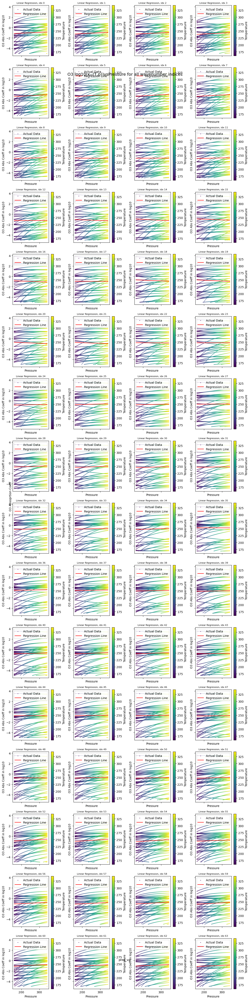

In [40]:
# O3 LR power 1

O3_kappas_power1_temp = perform_LR(O3_Temp_per_wvn,O3_kappas,O3_Temp_per_wvn,"Pressure","O3",wvn,test_temperature)
np.savez('O3_kappas_power1_temp.npz', data1=O3_kappas_power1_temp)

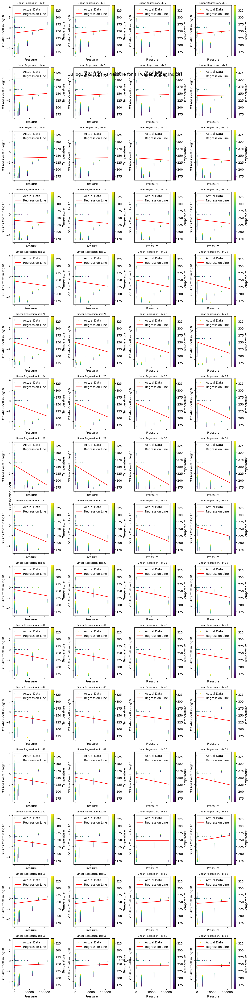

In [41]:
O3_kappas_power1_pres = perform_LR(O3_Pressure_per_wvn,O3_kappas,O3_Temp_per_wvn,"Pressure","O3",wvn,test_pressure)
np.savez('O3_kappas_power1_pres.npz', data1=O3_kappas_power1_pres)